In [1]:
import tensorflow as tf
import numpy as np
import glob
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from model import MY_MODEL
from tensorflow.keras.callbacks import Callback
from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint, EarlyStopping, LearningRateScheduler
from tensorflow.keras.metrics import Precision, Recall
%matplotlib inline

2024-04-24 14:28:18.879175: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-04-24 14:28:19.637821: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [2]:
import tensorflow as tf
import numpy as np
import os
import matplotlib.pyplot as plt

In [3]:
# train_img_path = 'VOC2012/JPEGImages/'
# train_mask_path = 'VOC2012/SegmentationClass/'
# IMG_SIZE = 384

In [4]:
# def match_images(image_dir, mask_dir):
#     image_files = os.listdir(image_dir)
#     mask_files = os.listdir(mask_dir)

#     image_dict = {os.path.splitext(file)[0]: file for file in image_files}
#     mask_dict = {os.path.splitext(file)[0]: file for file in mask_files}
    
#     common_files = set(image_dict.keys()) & set(mask_dict.keys())

#     image_list = [os.path.join(image_dir, image_dict[file]) for file in common_files]
#     mask_list = [os.path.join(mask_dir, mask_dict[file]) for file in common_files]

#     return image_list, mask_list


# actual_images, segmented_images = match_images(train_img_path,train_mask_path)

In [5]:
# dataset = tf.data.Dataset.from_tensor_slices((actual_images, segmented_images))

In [6]:
# for image_path, mask_path in dataset.take(1):
#     print("Image path:", image_path)
#     print("Mask path:", mask_path)

In [7]:
# def convert_to_grayscale(image):
#     grayscale_image = tf.image.rgb_to_grayscale(image)
#     return grayscale_image

In [8]:
# def dataset_gen(img,mask):
    
#     image = tf.io.decode_jpeg(tf.io.read_file(img))
#     # mask = tf.io.decode_png(tf.io.read_file(mask), channels=1)
#     mask = convert_to_grayscale(mask)
#     return image, mask

In [9]:
# dataset = dataset.map(dataset_gen)

In [10]:
# def preprocessing(image, mask):
#     image = tf.image.resize(image, (IMG_SIZE,IMG_SIZE)) / 255.0
#     mask = tf.image.resize(mask, (IMG_SIZE, IMG_SIZE)) / 255.0
#     return image,mask

In [11]:
# dataset = dataset.map(preprocessing)

In [12]:
# for img,mask in dataset.take(1):
#     print(img.shape)
#     print(mask.shape)

In [13]:
# dataset =  dataset.shuffle(buffer_size=8,reshuffle_each_iteration = True).batch(16).prefetch(tf.data.AUTOTUNE)

In [14]:
# def splits(dataset, train_ratio=0.8, val_ratio=0.1, test_ratio=0.1):
#     dataset_size = len(dataset)
#     dataset_train = dataset.take(int(train_ratio * dataset_size))
#     dataset_val_test = dataset.skip(int(train_ratio * dataset_size))
#     dataset_val = dataset_val_test.take(int(val_ratio * dataset_size))
#     dataset_test = dataset_val_test.skip(int(test_ratio * dataset_size))
#     return dataset_train, dataset_val, dataset_test

In [15]:
# dataset_train,dataset_val,dataset_test = splits(dataset)

In [16]:
# for img,seg in dataset_train.take(1):
#     print(img.shape)
#     print(seg.shape)

In [17]:
# for img_batch, mask_batch in dataset.take(1):
#     for i in range(16):
#         plt.subplot(1,2,1)
#         plt.imshow(img_batch[i].numpy())
#         plt.subplot(1,2,2)
#         plt.imshow(np.squeeze(mask_batch[i].numpy()))
#         plt.show()

In [18]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from PIL import Image
import os
# import albumentations as A
# from tensorflow_examples.models.pix2pix import pix2pix
# from keras_lr_finder import LRFinder
# from tensorflow import keras

2024-04-24 14:28:41.779103: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-04-24 14:28:41.787125: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-04-24 14:28:41.787386: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

(384, 384, 3)


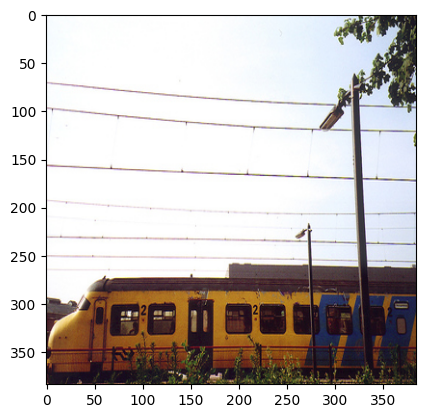

(384, 384, 1)


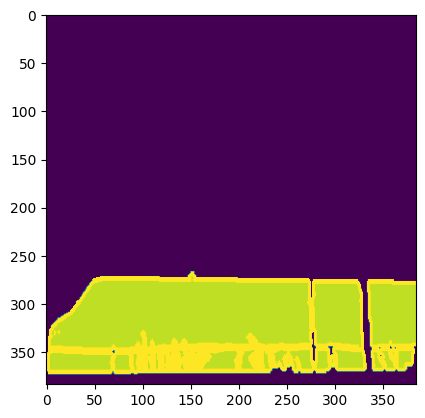

(384, 384, 3)


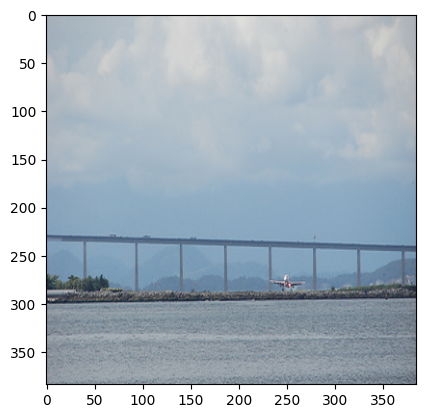

(384, 384, 1)


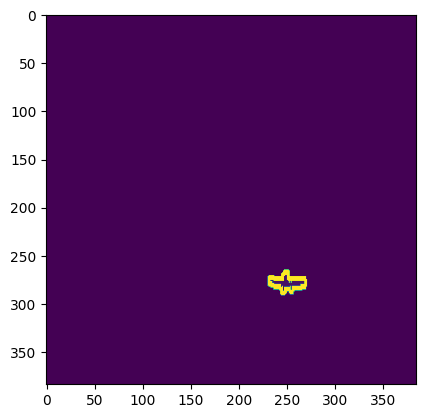

In [19]:
IMG_HEIGHT = 384
IMG_WIDTH  = 384

def Read_All_Data(path):
    temp = []
    updated_path = os.path.join(path, "VOC2012", "ImageSets", "Segmentation", "trainval.txt")
    with open(updated_path, "r") as file_:
        Instances = file_.read().split()
        img_arr = []
        seg_arr = []
        for img in Instances:
            path_img = os.path.join(path, "VOC2012", "JPEGImages", img + ".jpg")
            path_seg = os.path.join(path, "VOC2012", "SegmentationClass", img + ".png")
            img = np.array(Image.open(path_img).resize((IMG_WIDTH, IMG_HEIGHT)))
            seg = np.array(Image.open(path_seg).resize((IMG_WIDTH, IMG_HEIGHT)))
            seg[seg == 255] = 21
            seg = np.expand_dims(seg, axis=-1)
            img_arr.append(img)
            seg_arr.append(seg)
    return np.array(img_arr), np.array(seg_arr)

path = "pascal-voc-2012"
full_dataset = tf.data.Dataset.from_tensor_slices(Read_All_Data(path))

DATASET_SIZE = 2913

train_size = int(0.7 * DATASET_SIZE)
val_size = int(0.2 * DATASET_SIZE)
test_size = int(0.1 * DATASET_SIZE)

full_dataset = full_dataset.shuffle(buffer_size = DATASET_SIZE)
train_dataset = full_dataset.take(train_size)
test_dataset = full_dataset.skip(train_size)
val_dataset = test_dataset.skip(test_size)
test_dataset = test_dataset.take(test_size)

def normalize(input_image, input_mask):
    input_image = tf.cast(input_image, tf.float32) / 255.0
    return input_image, input_mask

def load_image_train(input_image, input_mask):
    # Random flip the image and mask
    if tf.random.uniform(()) > 0.5:
        input_image = tf.image.flip_left_right(input_image)
        input_mask = tf.image.flip_left_right(input_mask)

    input_image, input_mask = normalize(input_image, input_mask)

    return input_image, input_mask

def load_image_test(input_image, input_mask):
    input_image, input_mask = normalize(input_image, input_mask)

    return input_image, input_mask

BATCH_SIZE = 16
BUFFER_SIZE = 1000
STEPS_PER_EPOCH = train_size // BATCH_SIZE

train = train_dataset.map(load_image_train, num_parallel_calls=tf.data.experimental.AUTOTUNE)
val   = train_dataset.map(load_image_test, num_parallel_calls=tf.data.experimental.AUTOTUNE)
test = test_dataset.map(load_image_test, num_parallel_calls=tf.data.experimental.AUTOTUNE)

dataset_train = train.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
# dataset_train = train_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
dataset_test = test.batch(BATCH_SIZE)
dataset_val = val.batch(BATCH_SIZE)

for image, mask in train.take(2):
    sample_image, sample_mask = image, mask
    plt.imshow(sample_image)
    print(sample_image.shape)
    plt.show()
    plt.imshow(sample_mask)
    print(sample_mask.shape)
    plt.show()

In [20]:
dataset_train

<_BatchDataset element_spec=(TensorSpec(shape=(None, 384, 384, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 384, 384, 1), dtype=tf.uint8, name=None))>

In [21]:
numClass = 22

In [22]:
model = MY_MODEL(384, 384, numClass)

*** Building MY_MODEL Network ***


/home/featurize/data/resnet/resnet50.py:265: UserWarning: The output shape of `ResNet50(include_top=False)` has been changed since Keras 2.2.0.
  warnings.warn('The output shape of `ResNet50(include_top=False)` '


*** Output_Shape => (None, 384, 384, 22) ***


In [23]:
# model.summary()

In [24]:
# for layer in model.layers:
#     if isinstance(layer, tf.keras.layers.BatchNormalization):
#         layer.momentum = 0.9997
#     elif isinstance(layer, tf.keras.layers.Conv2D):
#         layer.kernel_regularizer = tf.keras.regularizers.l2(1e-4)
# reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
#     monitor='val_loss', 
#     factor=0.1,         
#     patience=10,         
#     min_lr=0.000001,     
#     verbose=1
# )

In [25]:
# def softmax_dice_loss(y_true, y_pred_logits):
#     # Apply softmax to convert logits to probabilities
#     y_pred = tf.nn.softmax(y_pred_logits)
    
#     # Convert labels to one-hot encoding
#     y_true = tf.one_hot(tf.cast(y_true, tf.int32), depth=tf.shape(y_pred)[-1])
    
#     # Define smooth term to avoid division by zero
#     smooth = 1e-6
    
#     # Initialize variable to accumulate loss
#     total_loss = 0.0
    
#     # Calculate Dice Loss for each class
#     for class_idx in range(y_pred.shape[-1]):
#         # Calculate intersection and union for the current class
#         y_true_class = y_true[..., class_idx]
#         y_pred_class = y_pred[..., class_idx]
        
#         # Remove the extra dimension from y_true_class
#         y_true_class = tf.squeeze(y_true_class, axis=-1)  # <-- This is the key line
        
#         intersection = tf.reduce_sum(y_true_class * y_pred_class)
#         union = tf.reduce_sum(y_true_class + y_pred_class)
        
#         # Compute Dice coefficient and subtract from 1 for loss
#         dice_coeff = (2. * intersection + smooth) / (union + smooth)
#         dice_loss = 1 - dice_coeff
        
#         # Accumulate loss
#         total_loss += dice_loss
    
#     # Average the loss across all classes
#     return total_loss / tf.cast(y_pred.shape[-1], tf.float32)

In [26]:
class MeanIoU(tf.keras.metrics.MeanIoU):
    def __call__(self, y_true, y_pred, sample_weight=None):
        y_pred = tf.argmax(y_pred, axis=-1)
        return super().__call__(y_true, y_pred, sample_weight=sample_weight)

# optimizer = tf.keras.optimizers.Adam(learning_rate=5e-4)

loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)


def dice_loss_multiclass(y_true, y_pred, num_classes=numClass, smooth=1e-6):
    y_true = tf.one_hot(tf.cast(y_true, tf.int32), depth=num_classes)
    y_true = tf.cast(y_true, tf.float32)
    
    y_pred = tf.nn.softmax(y_pred, axis=-1)

    dice_loss = 0
    for c in range(num_classes):
        true_c = y_true[..., c]
        pred_c = y_pred[..., c]

        true_c = tf.squeeze(true_c, axis=-1)
        
        intersection = tf.reduce_sum(true_c * pred_c, axis=[1, 2])
        union = tf.reduce_sum(true_c, axis=[1, 2]) + tf.reduce_sum(pred_c, axis=[1, 2])
        dice_c = (2. * intersection + smooth) / (union + smooth)
        dice_loss += (1 - dice_c)
    
    return dice_loss / num_classes

def combined_loss_multiclass(y_true, y_pred, num_classes=11):
    ce_loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)(y_true, y_pred)
    d_loss = dice_loss_multiclass(y_true, y_pred, num_classes)
    total_loss = (ce_loss + d_loss) / 2.0
    return total_loss

train_loss = tf.keras.metrics.Mean(name='train_loss')
train_accuracy = tf.keras.metrics.SparseCategoricalAccuracy(name='train_accuracy')
train_iou = MeanIoU(numClass, name='train_iou')

test_loss = tf.keras.metrics.Mean(name='test_loss')
test_accuracy = tf.keras.metrics.SparseCategoricalAccuracy(name='test_accuracy')
test_iou = MeanIoU(numClass, name='test_iou')

In [27]:
base_learning_rate = 0.01
momentum = 0.9
weight_decay = 0.0001
power = 1.2
total_steps = 18550

learning_rate_schedule = tf.keras.optimizers.schedules.PolynomialDecay(
    initial_learning_rate=base_learning_rate,
    decay_steps=total_steps,
    end_learning_rate=0.0, 
    power=power
)

class SGDW(tf.keras.optimizers.SGD):
    def __init__(self, weight_decay, *args, **kwargs):
        super(SGDW, self).__init__(*args, **kwargs)
        self.weight_decay = weight_decay

    def _resource_apply_dense(self, grad, var, apply_state=None):
        var_dtype = var.dtype.base_dtype
        lr_t = self._decayed_lr(var_dtype)
        wd = lr_t * self.weight_decay

        var.assign_sub((lr_t * grad) + (wd * var))

optimizer = SGDW(
    weight_decay=weight_decay,
    learning_rate=learning_rate_schedule,
    momentum=momentum
)

In [28]:
train_losses = []
train_accuracies = []
train_ious = []
test_losses = []
test_accuracies = []
test_ious = []
train_precisions = []
train_recalls = []
test_precisions = []
test_recalls = []


train_precision = Precision()
train_recall = Recall()
test_precision = Precision()
test_recall = Recall()

@tf.function
def train_step(images, labels):
    with tf.GradientTape() as tape:
        predictions = model(images, training=True)
        loss = combined_loss_multiclass(labels, predictions, numClass)
    gradients = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(gradients, model.trainable_variables))

    train_loss(loss)
    train_accuracy(labels, predictions)
    train_iou(labels, predictions)
    train_precision.update_state(labels, tf.argmax(predictions, axis=-1))
    train_recall.update_state(labels, tf.argmax(predictions, axis=-1))

@tf.function
def test_step(images, labels):
    predictions = model(images, training=False)
    t_loss = combined_loss_multiclass(labels, predictions, numClass)

    test_loss(t_loss)
    test_accuracy(labels, predictions)
    test_iou(labels, predictions)
    test_precision.update_state(labels, tf.argmax(predictions, axis=-1))
    test_recall.update_state(labels, tf.argmax(predictions, axis=-1))

EPOCHS = 150

for epoch in range(EPOCHS):
    train_loss.reset_states()
    train_accuracy.reset_states()
    train_iou.reset_states()
    train_precision.reset_states()
    train_recall.reset_states()
    test_loss.reset_states()
    test_accuracy.reset_states()
    test_iou.reset_states()
    test_precision.reset_states()
    test_recall.reset_states()

    for images, labels in dataset_train:
        train_step(images, labels)

    for test_images, test_labels in dataset_val:
        test_step(test_images, test_labels)


    print('Epoch {:3d}, Loss: {:.3f}, Accuracy: {:.3f}, IOU: {:.3f}, Precision: {:.3f}, Recall: {:.3f}, Test Loss: {:.3f}, Test Accuracy: {:.3f}, Test IOU: {:.3f}, Test Precision: {:.3f}, Test Recall: {:.3f}'.format(
        epoch+1, train_loss.result(), train_accuracy.result()*100, train_iou.result(), 
        train_precision.result(), train_recall.result(), 
        test_loss.result(), test_accuracy.result()*100, test_iou.result(), 
        test_precision.result(), test_recall.result()
    ))

    train_losses.append(train_loss.result())
    train_accuracies.append(train_accuracy.result().numpy() * 100)
    train_ious.append(train_iou.result())
    train_precisions.append(train_precision.result().numpy())
    train_recalls.append(train_recall.result().numpy())
    test_losses.append(test_loss.result())
    test_accuracies.append(test_accuracy.result().numpy() * 100)
    test_ious.append(test_iou.result())
    test_precisions.append(test_precision.result().numpy())
    test_recalls.append(test_recall.result().numpy())

2024-04-24 14:29:04.530589: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:432] Loaded cuDNN version 8600
2024-04-24 14:29:06.483535: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:606] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
2024-04-24 14:29:11.202207: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x7f9aa6437e10 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-04-24 14:29:11.202249: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 3090, Compute Capability 8.6
2024-04-24 14:29:11.277493: I ./tensorflow/compiler/jit/device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


Epoch   1, Loss: 1.186, Accuracy: 67.309, IOU: 0.053, Precision: 0.645, Recall: 0.209, Test Loss: 1.550, Test Accuracy: 69.363, Test IOU: 0.032, Test Precision: 0.000, Test Recall: 0.000
Epoch   2, Loss: 1.056, Accuracy: 70.386, IOU: 0.077, Precision: 0.791, Recall: 0.307, Test Loss: 1.594, Test Accuracy: 69.190, Test IOU: 0.031, Test Precision: 0.000, Test Recall: 0.000
Epoch   3, Loss: 0.964, Accuracy: 72.973, IOU: 0.122, Precision: 0.831, Recall: 0.428, Test Loss: 4.111, Test Accuracy: 69.339, Test IOU: 0.032, Test Precision: 0.000, Test Recall: 0.000
Epoch   4, Loss: 0.913, Accuracy: 74.404, IOU: 0.165, Precision: 0.852, Recall: 0.518, Test Loss: 2.198, Test Accuracy: 69.287, Test IOU: 0.032, Test Precision: 0.609, Test Recall: 0.000
Epoch   5, Loss: 0.868, Accuracy: 76.172, IOU: 0.208, Precision: 0.842, Recall: 0.565, Test Loss: 2.173, Test Accuracy: 69.282, Test IOU: 0.032, Test Precision: 0.954, Test Recall: 0.005
Epoch   6, Loss: 0.860, Accuracy: 76.259, IOU: 0.217, Precision: 

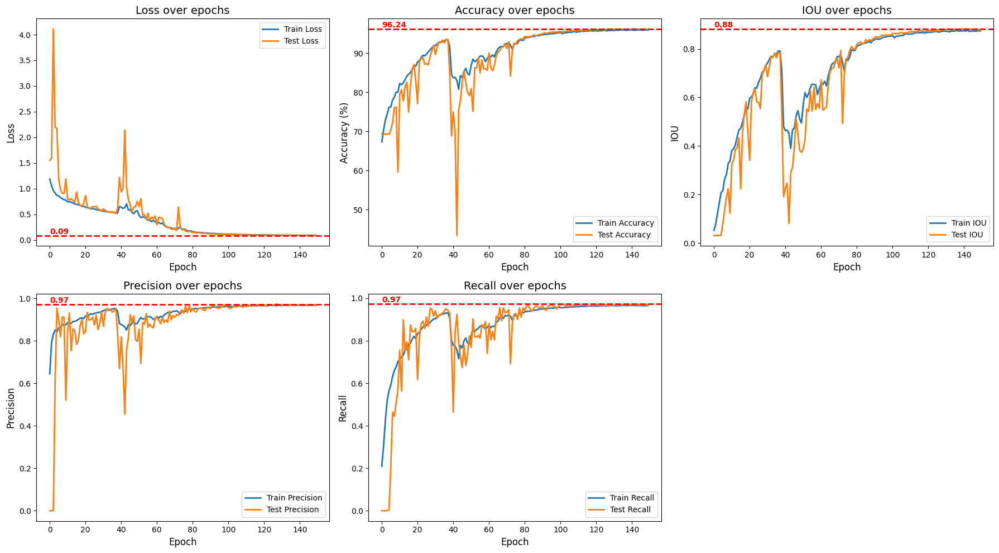

In [33]:
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

plt.figure(figsize=(18, 10))

def draw_plot(position, metric_name, train_data, test_data, ylabel, find_max=True, second_max=False):
    plt.subplot(2, 3, position)
    plt.plot(train_data, label=f'Train {metric_name}', linewidth=2)
    plt.plot(test_data, label=f'Test {metric_name}', linewidth=2)
    plt.title(f'{metric_name} over epochs', fontsize=14)
    plt.xlabel('Epoch', fontsize=12)
    plt.ylabel(ylabel, fontsize=12)
    
    if find_max:
        special_value = max(test_data)
        if second_max:
            temp_data = test_data.copy()
            temp_data.remove(special_value)
            special_value = max(temp_data)
        line_label = 'Max' if not second_max else '2nd Max'
    else:
        special_value = min(test_data)
        line_label = 'Min'
    
    plt.axhline(y=special_value, color='r', linestyle='--', linewidth=2)
    plt.text(0, special_value, f'{special_value:.2f}', color='red', verticalalignment='bottom', horizontalalignment='left', fontweight='bold')
    plt.legend(loc='best')

draw_plot(1, 'Loss', train_losses, test_losses, 'Loss', find_max=False)
draw_plot(2, 'Accuracy', train_accuracies, test_accuracies, 'Accuracy (%)', find_max=True)
draw_plot(3, 'IOU', train_ious, test_ious, 'IOU', find_max=True)
draw_plot(4, 'Precision', train_precisions, test_precisions, 'Precision', find_max=True, second_max=True)
draw_plot(5, 'Recall', train_recalls, test_recalls, 'Recall', find_max=True)

plt.tight_layout()
plt.show()

In [34]:
model.save('my_model.h5') 

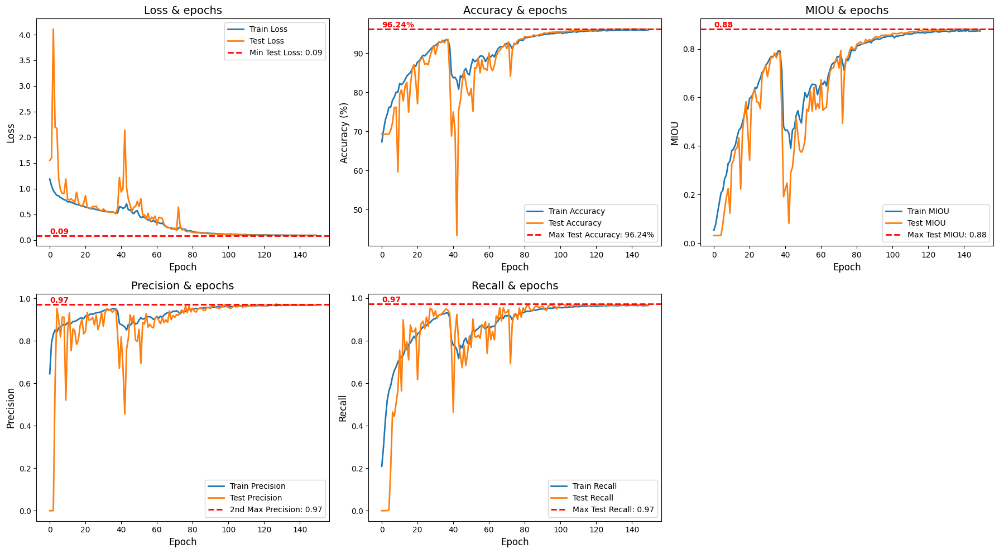

In [35]:
plt.figure(figsize=(18, 10))

# Enhanced Loss plot
plt.subplot(2, 3, 1)
plt.plot(train_losses, label='Train Loss', linewidth=2)
plt.plot(test_losses, label='Test Loss', linewidth=2)
plt.title('Loss & epochs', fontsize=14)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)
min_loss = min(test_losses)
plt.axhline(y=min_loss, color='r', linestyle='--', linewidth=2)
plt.text(0, min_loss, f'{min_loss:.2f}', color='red', verticalalignment='bottom', horizontalalignment='left', fontweight='bold')
handles, labels = plt.gca().get_legend_handles_labels()
handles.append(Line2D([0], [0], color='r', lw=2, linestyle='--', label=f'Min Test Loss: {min_loss:.2f}'))
plt.legend(handles=handles, loc='upper right')

# Enhanced Accuracy plot
plt.subplot(2, 3, 2)
plt.plot(train_accuracies, label='Train Accuracy', linewidth=2)
plt.plot(test_accuracies, label='Test Accuracy', linewidth=2)
plt.title('Accuracy & epochs', fontsize=14)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Accuracy (%)', fontsize=12)
max_accuracy = max(test_accuracies)
plt.axhline(y=max_accuracy, color='r', linestyle='--', linewidth=2)
plt.text(0, max_accuracy, f'{max_accuracy:.2f}%', color='red', verticalalignment='bottom', horizontalalignment='left', fontweight='bold')
handles, labels = plt.gca().get_legend_handles_labels()
handles.append(Line2D([0], [0], color='r', lw=2, linestyle='--', label=f'Max Test Accuracy: {max_accuracy:.2f}%'))
plt.legend(handles=handles, loc='lower right')

# Enhanced IOU plot
plt.subplot(2, 3, 3)
plt.plot(train_ious, label='Train MIOU', linewidth=2)
plt.plot(test_ious, label='Test MIOU', linewidth=2)
plt.title('MIOU & epochs', fontsize=14)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('MIOU', fontsize=12)
max_iou = max(test_ious)
plt.axhline(y=max_iou, color='r', linestyle='--', linewidth=2)
plt.text(0, max_iou, f'{max_iou:.2f}', color='red', verticalalignment='bottom', horizontalalignment='left', fontweight='bold')
handles, labels = plt.gca().get_legend_handles_labels()
handles.append(Line2D([0], [0], color='r', lw=2, linestyle='--', label=f'Max Test MIOU: {max_iou:.2f}'))
plt.legend(handles=handles, loc='lower right')

plt.subplot(2, 3, 4)
plt.plot(train_precisions, label='Train Precision', linewidth=2)
plt.plot(test_precisions, label='Test Precision', linewidth=2)
plt.title('Precision & epochs', fontsize=14)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Precision', fontsize=12)
temp_precisions = test_precisions.copy()
temp_precisions.remove(max(temp_precisions))
second_max_precisions = max(temp_precisions)
plt.axhline(y=second_max_precisions, color='r', linestyle='--', linewidth=2)
plt.text(0, second_max_precisions, f'{second_max_precisions:.2f}', color='red', verticalalignment='bottom', horizontalalignment='left', fontweight='bold')
handles, labels = plt.gca().get_legend_handles_labels()
handles.append(Line2D([0], [0], color='r', lw=2, linestyle='--', label=f'2nd Max Precision: {second_max_precisions:.2f}'))
plt.legend(handles=handles, loc='lower right')


# Enhanced Recall plot
plt.subplot(2, 3, 5)
line1, = plt.plot(train_recalls, label='Train Recall', linewidth=2)
line2, = plt.plot(test_recalls, label='Test Recall', linewidth=2)
plt.title('Recall & epochs', fontsize=14)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Recall', fontsize=12)
max_recall = max(test_recalls)
max_index = test_recalls.index(max_recall)
plt.axhline(y=max_recall, color='r', linestyle='--', linewidth=2)
legend_line = Line2D([0], [0], color='r', lw=2, linestyle='--', label=f'Max Test Recall: {max_recall:.2f}')
handles, labels = plt.gca().get_legend_handles_labels()
handles.append(legend_line)
plt.legend(handles=handles, loc='lower right')
plt.text(0, max_recall, f'{max_recall:.2f}', color='red', verticalalignment='bottom', horizontalalignment='left', fontweight='bold')

plt.tight_layout()
plt.show()

1/1 [==============================] - 1s 1s/step


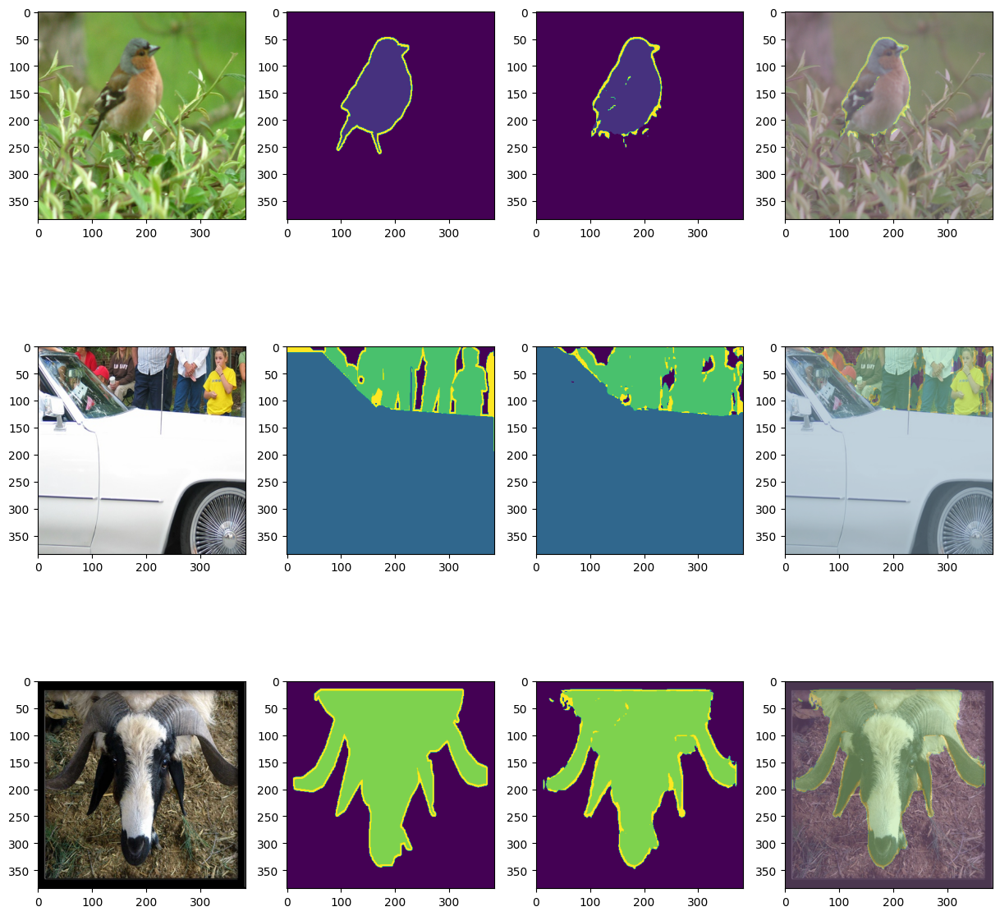

1/1 [==============================] - 0s 105ms/step


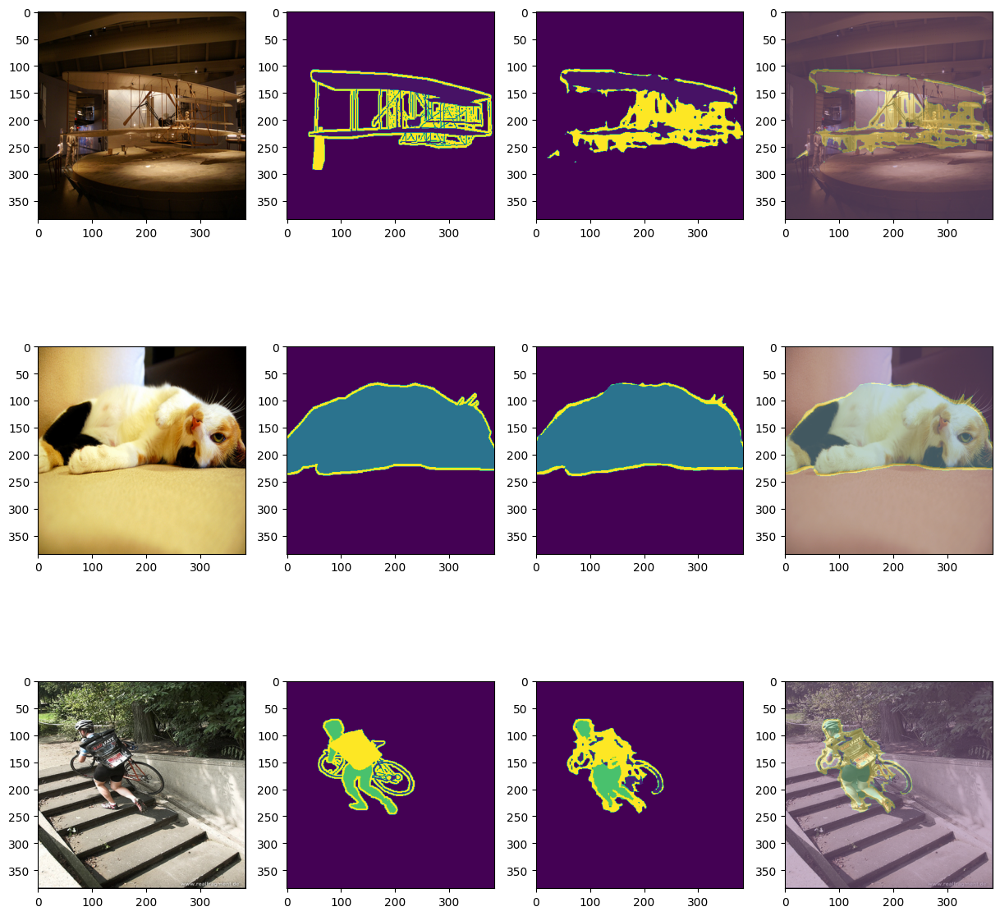

1/1 [==============================] - 0s 87ms/step


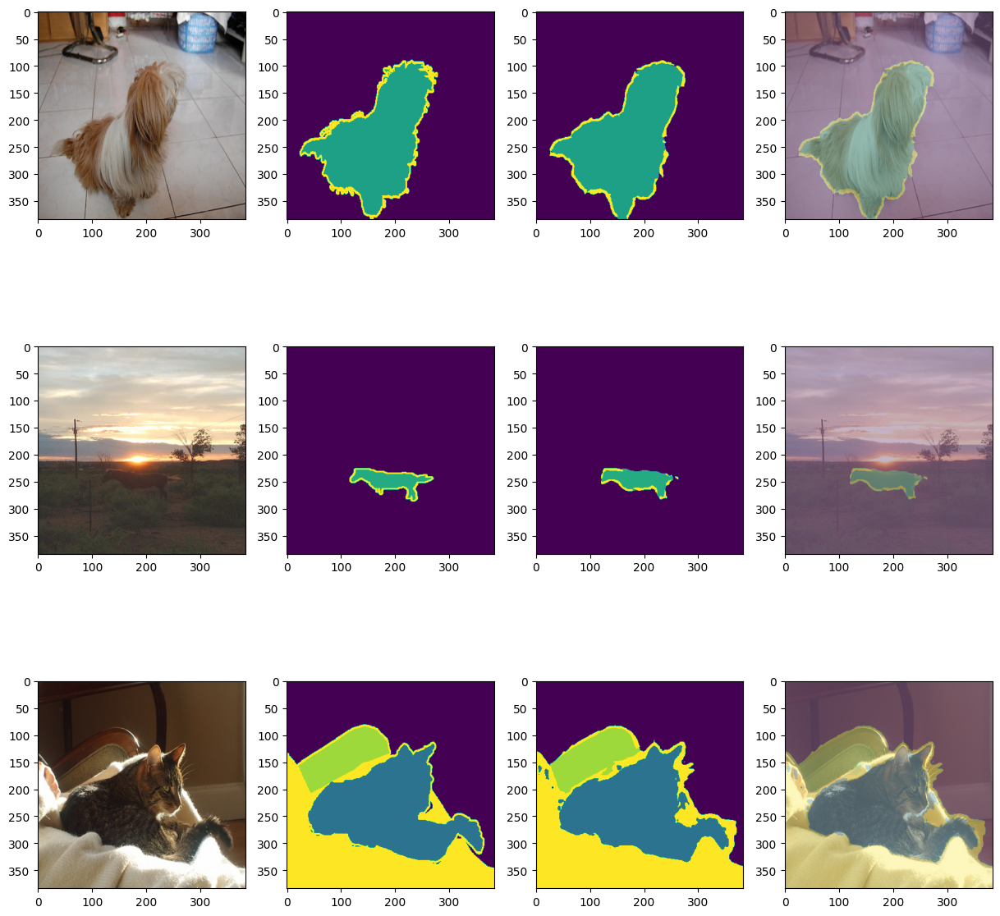

1/1 [==============================] - 0s 106ms/step


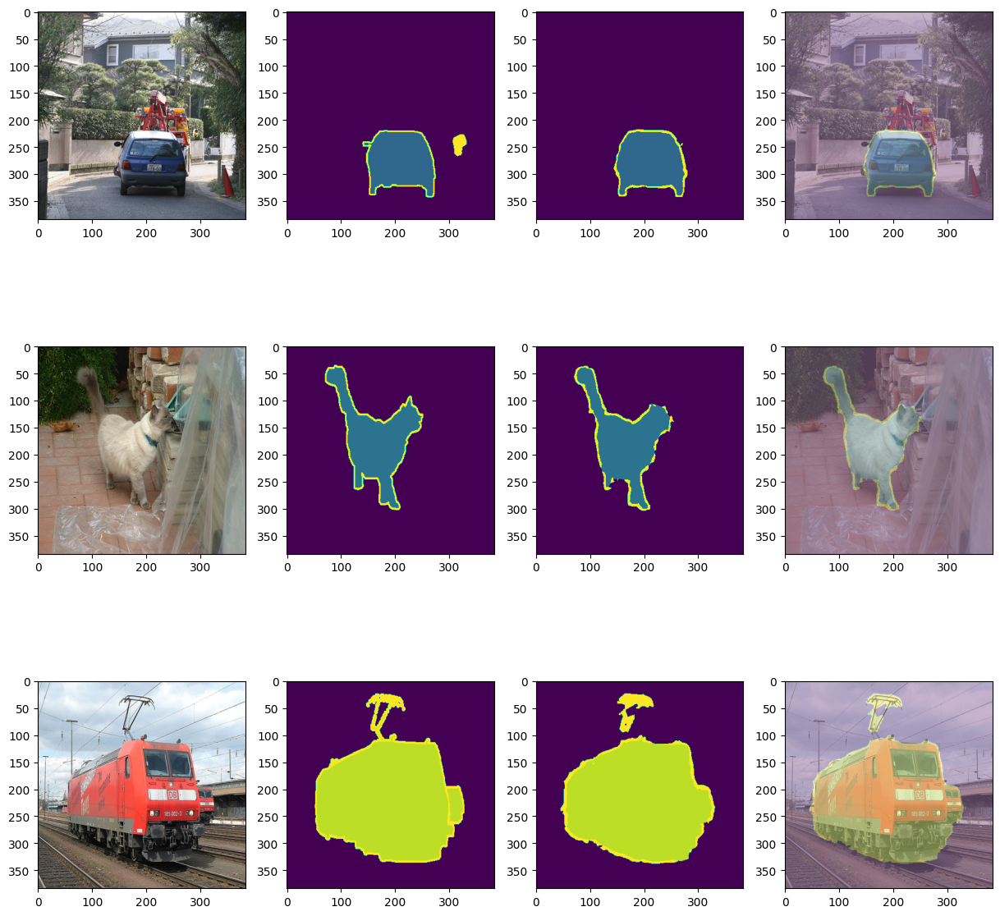

1/1 [==============================] - 0s 107ms/step


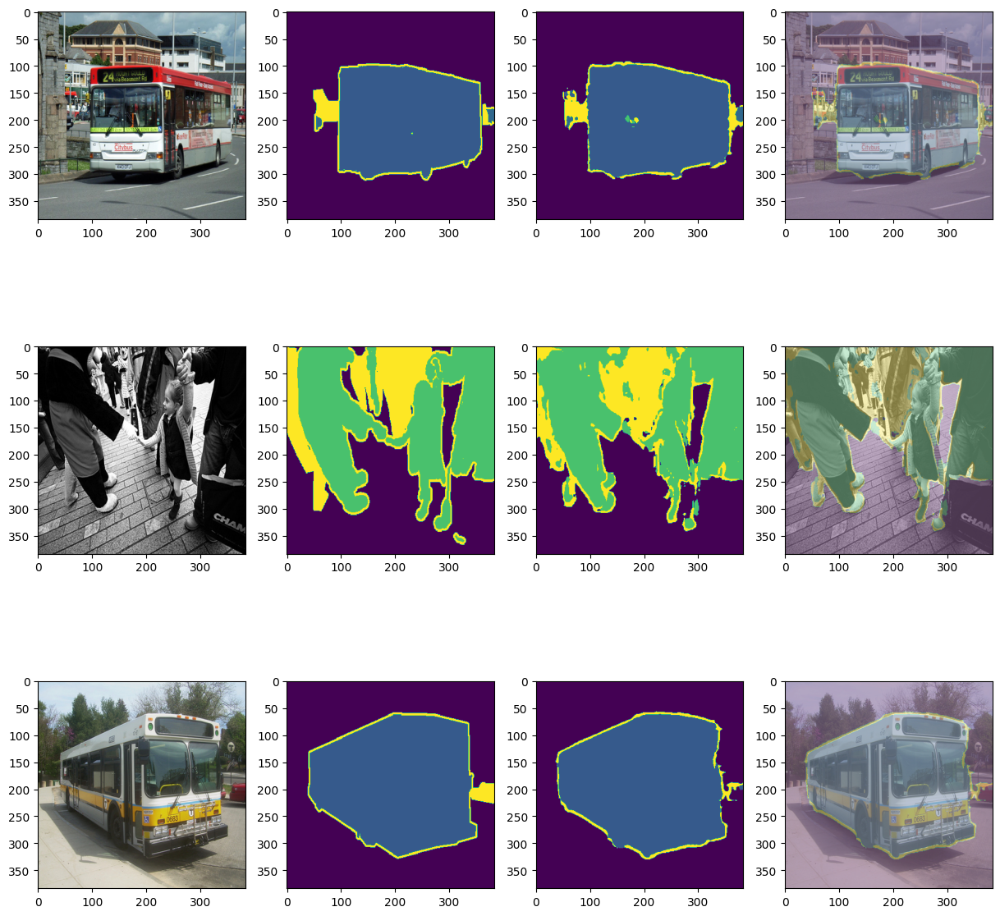

1/1 [==============================] - 0s 110ms/step


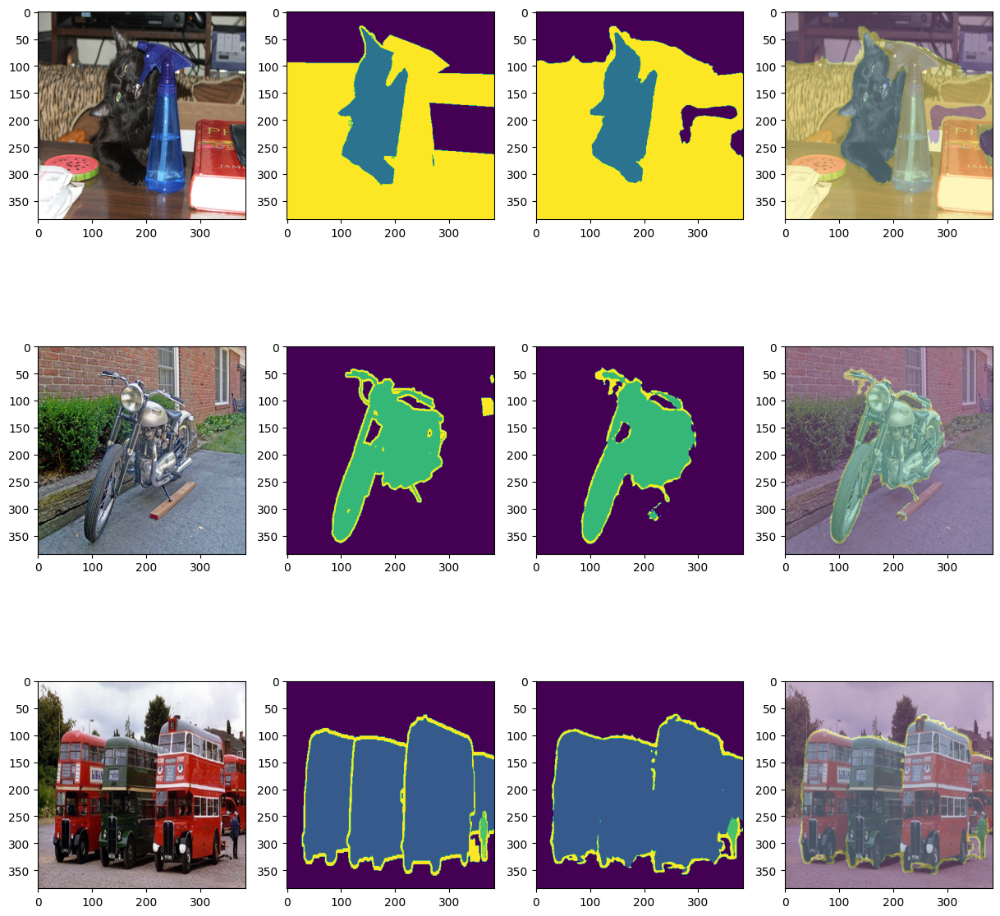

1/1 [==============================] - 0s 105ms/step


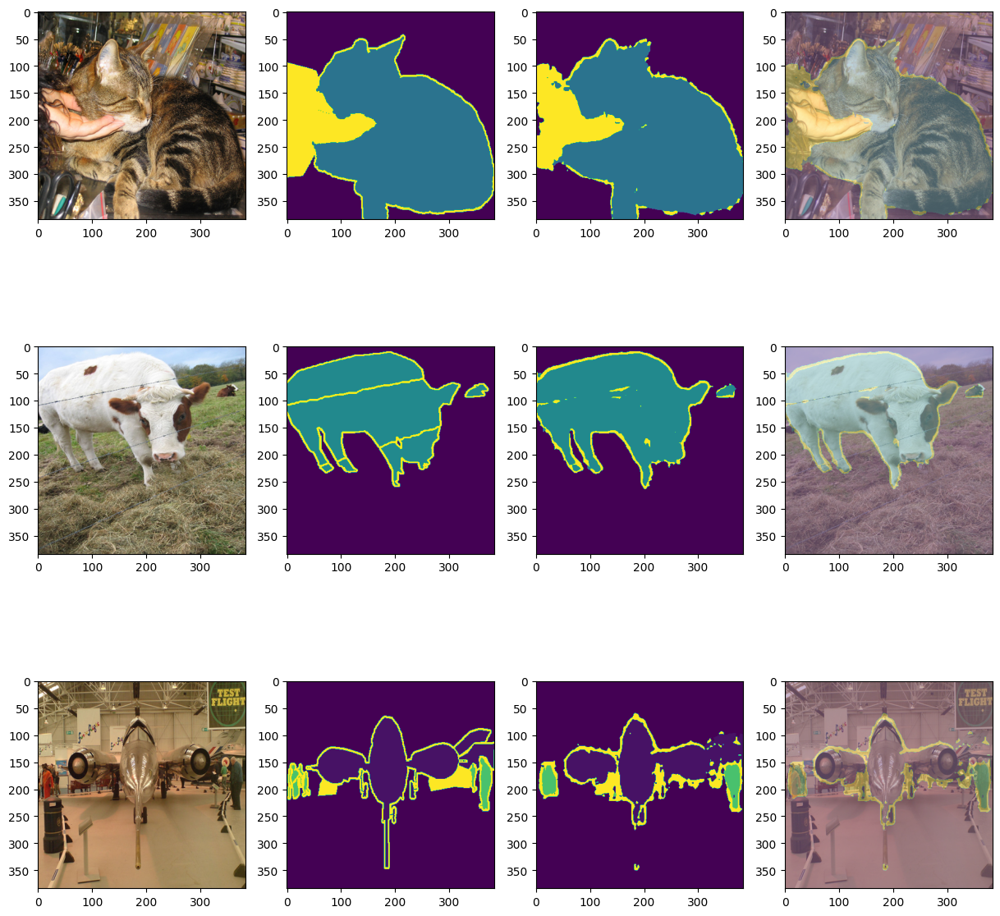

1/1 [==============================] - 0s 101ms/step


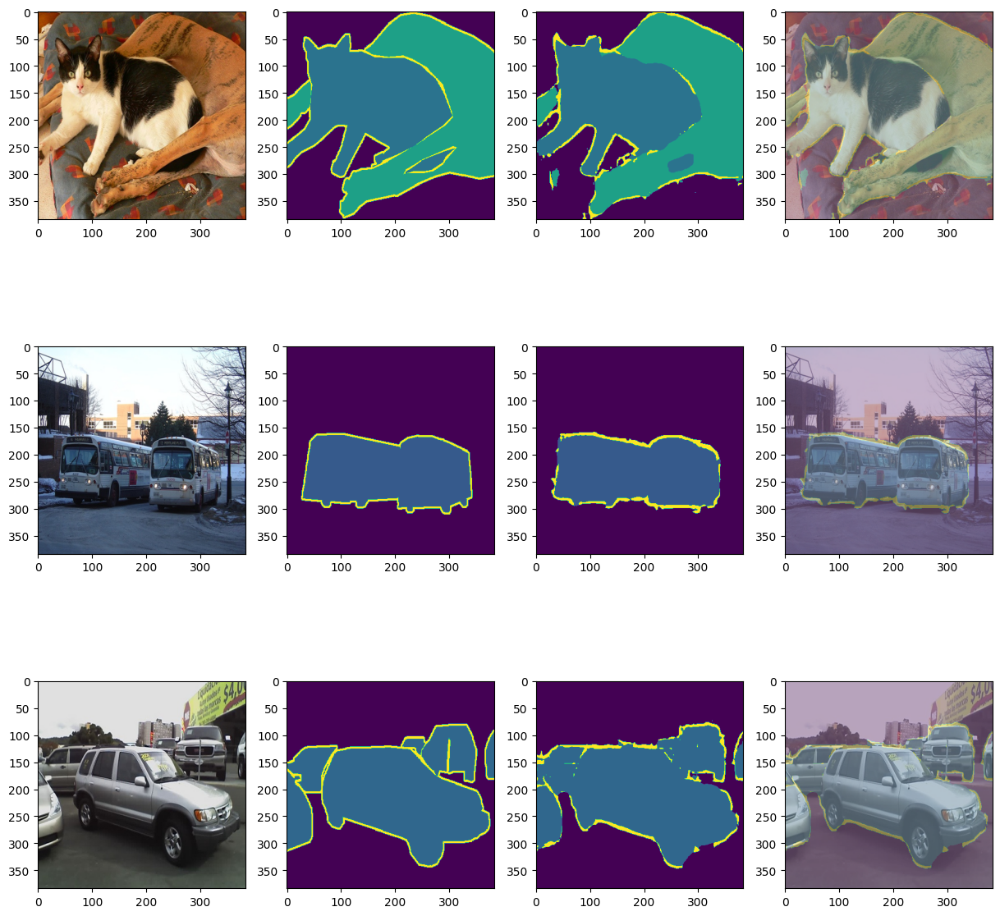

1/1 [==============================] - 0s 112ms/step


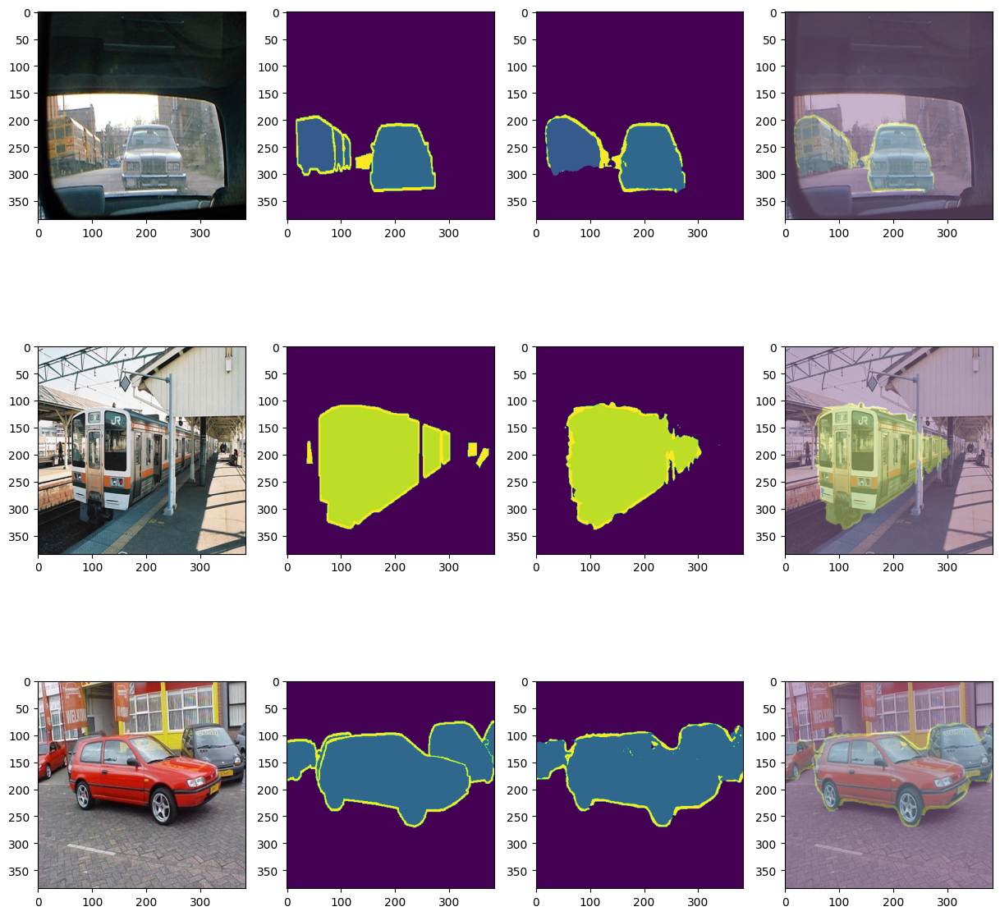

1/1 [==============================] - 0s 108ms/step


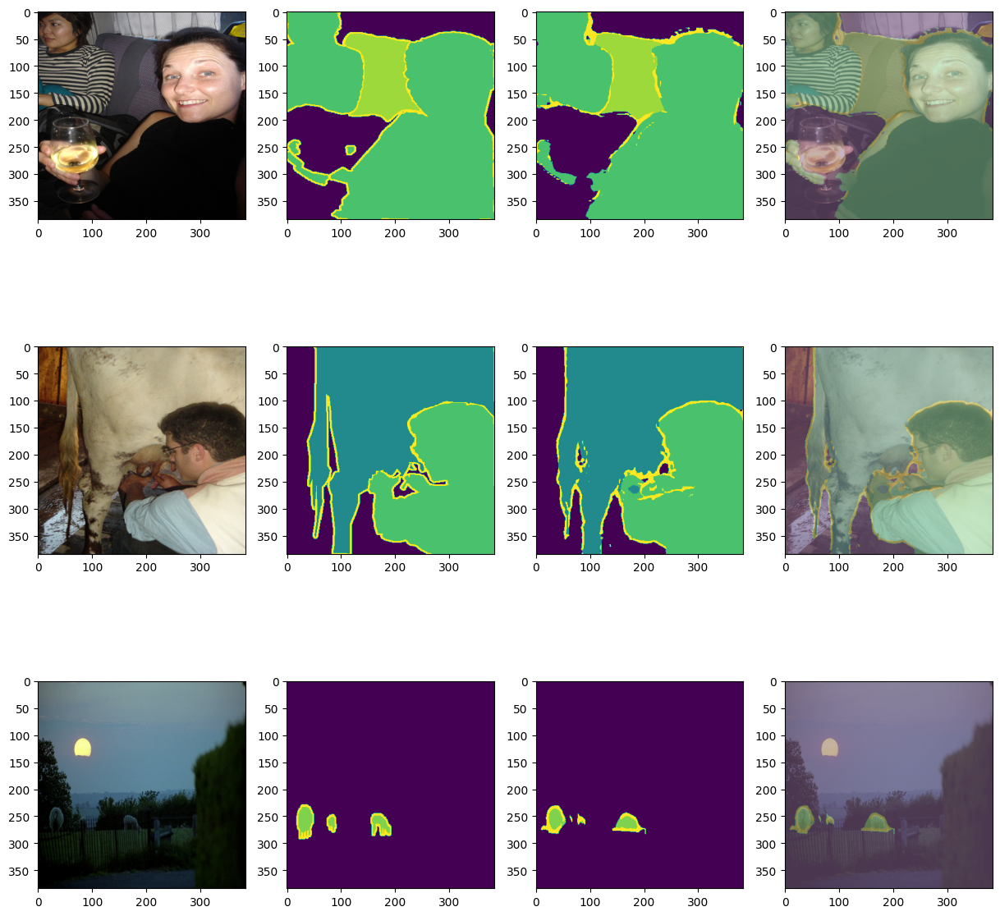

Mean IoU:  0.86853546
Accuracy:  0.9604092
Precision:  0.9683654
Recall:  0.9650365


In [38]:
from tensorflow.keras.metrics import MeanIoU
from tensorflow.keras.metrics import MeanIoU, Accuracy, Precision, Recall

miou_metric = MeanIoU(num_classes=22)
accuracy_metric = Accuracy()
precision_metric = Precision()
recall_metric = Recall()

model.save_weights('new_weight.h5')
model.load_weights('new_weight.h5')

# class_colors = {
#     0: 'red',
#     1: 'green',
#     2: 'blue',
#     3: 'cyan',
#     4: 'magenta',
#     5: 'yellow',
#     6: 'black',
#     7: 'white',
#     8: 'grey',
#     9: 'orange',
#     10: 'purple'
# }

# def draw_color_mapping(fig):
#     ax = fig.add_axes([0.92, 0.1, 0.02, 0.8]) 
#     ax.axis('off')
#     for i, (class_id, color) in enumerate(class_colors.items()):
#         ax.text(0.5, 1 - (i / len(class_colors)), f'Class {class_id}', ha='center', va='center', color=color, transform=ax.transAxes)

num = 3
for image, mask in dataset_val.take(10):
    pred_mask = model.predict(image)
    pred_mask = tf.argmax(pred_mask, axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    
    fig = plt.figure(figsize=(15, num * 5))
    for i in range(num):
        miou_metric.update_state(mask, pred_mask)
        accuracy_metric.update_state(mask, pred_mask)
        precision_metric.update_state(mask, pred_mask)
        recall_metric.update_state(mask, pred_mask)
        
        plt.subplot(num, 4, i * 4 + 1)
        plt.imshow(tf.keras.preprocessing.image.array_to_img(image[i]))
        
        plt.subplot(num, 4, i * 4 + 2)
        plt.imshow(tf.keras.preprocessing.image.array_to_img(mask[i]))
        
        plt.subplot(num, 4, i * 4 + 3)
        plt.imshow(tf.keras.preprocessing.image.array_to_img(pred_mask[i]))
        
        plt.subplot(num, 4, i * 4 + 4)
        overlay_mask = tf.keras.preprocessing.image.array_to_img(pred_mask[i])
        overlay_image = tf.keras.preprocessing.image.array_to_img(image[i])
        plt.imshow(overlay_image, alpha=0.7)
        plt.imshow(overlay_mask, alpha=0.3)
    
    plt.show()

miou = miou_metric.result().numpy()
accuracy = accuracy_metric.result().numpy()
precision = precision_metric.result().numpy()
recall = recall_metric.result().numpy()  
    
print("Mean IoU: ", miou)
print("Accuracy: ", accuracy)
print("Precision: ", precision)
print("Recall: ", recall)

1/1 [==============================] - 0s 102ms/step


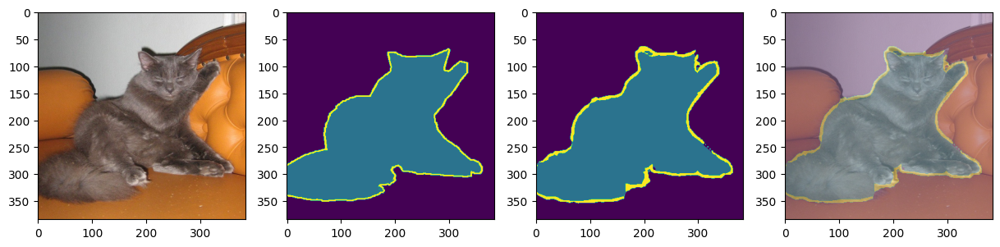

1/1 [==============================] - 0s 102ms/step


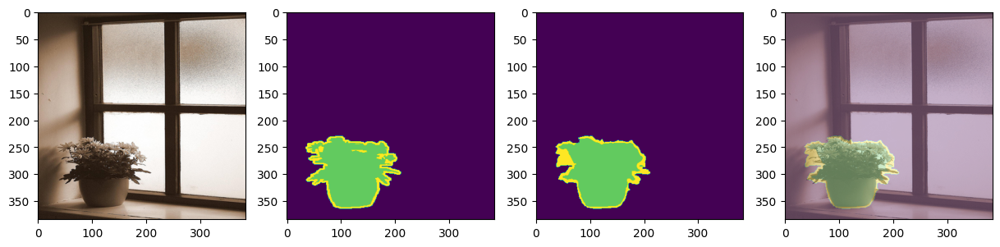

1/1 [==============================] - 0s 108ms/step


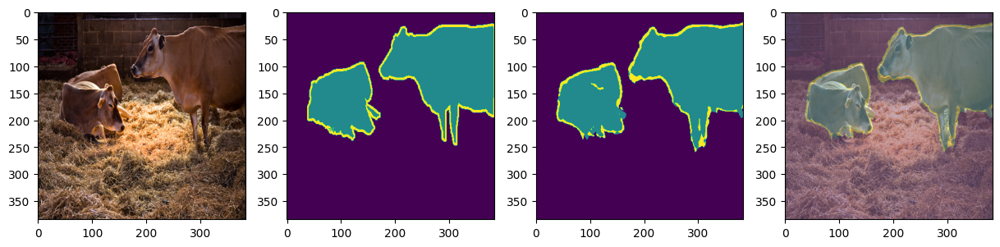

1/1 [==============================] - 0s 100ms/step


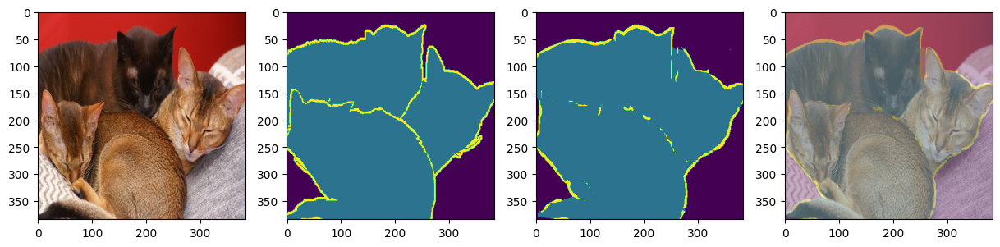

1/1 [==============================] - 0s 83ms/step


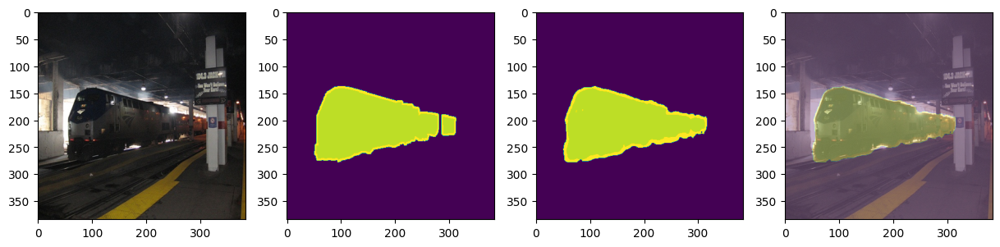

1/1 [==============================] - 0s 99ms/step


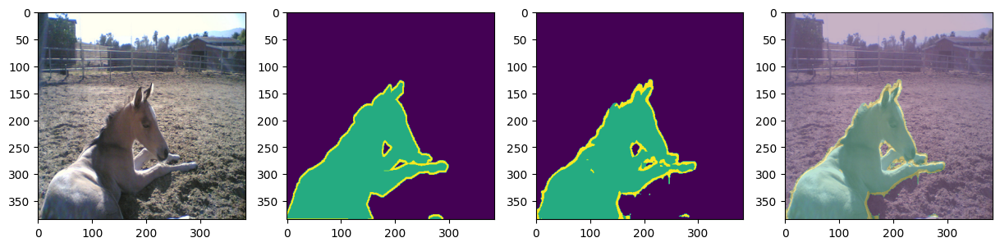

1/1 [==============================] - 0s 103ms/step


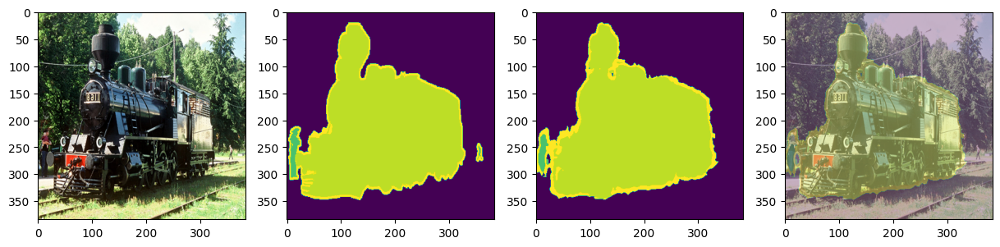

1/1 [==============================] - 0s 102ms/step


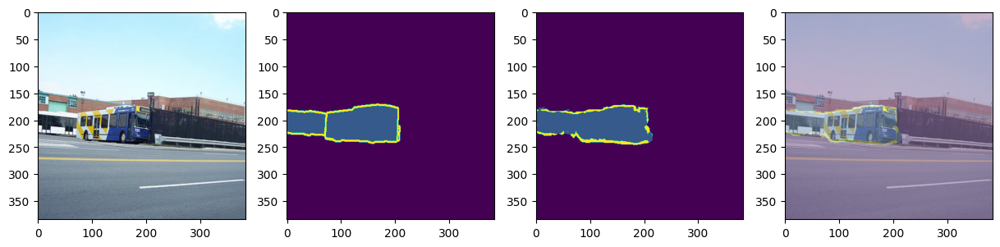

1/1 [==============================] - 0s 105ms/step


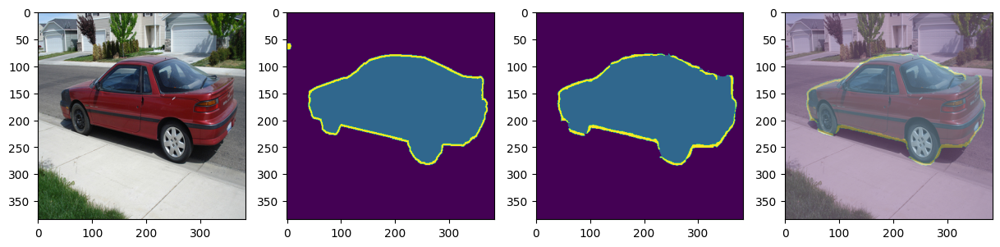

1/1 [==============================] - 0s 103ms/step


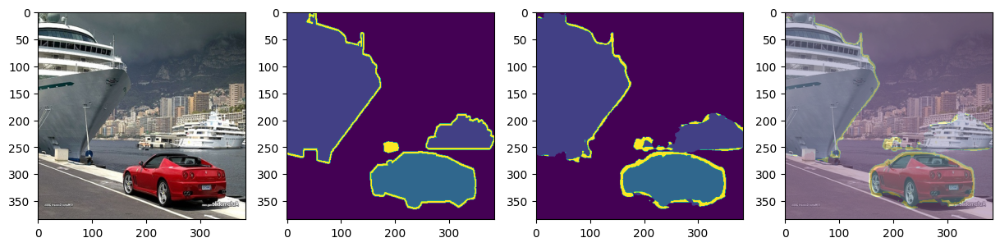

Mean IoU:  0.86853546
Accuracy:  0.9604092
Precision:  0.9683654
Recall:  0.9650365


In [39]:
num = 1
for image, mask in dataset_train.take(10):
    pred_mask = model.predict(image)
    pred_mask = tf.argmax(pred_mask, axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    
    fig = plt.figure(figsize=(15, num * 5))
    for i in range(num):
        plt.subplot(num, 4, i * 4 + 1)
        plt.imshow(tf.keras.preprocessing.image.array_to_img(image[i]))
        
        plt.subplot(num, 4, i * 4 + 2)
        plt.imshow(tf.keras.preprocessing.image.array_to_img(mask[i]))
        
        plt.subplot(num, 4, i * 4 + 3)
        plt.imshow(tf.keras.preprocessing.image.array_to_img(pred_mask[i]))
        
        plt.subplot(num, 4, i * 4 + 4)
        overlay_mask = tf.keras.preprocessing.image.array_to_img(pred_mask[i])
        overlay_image = tf.keras.preprocessing.image.array_to_img(image[i])
        plt.imshow(overlay_image, alpha=0.7)
        plt.imshow(overlay_mask, alpha=0.3)
    
    plt.show()

print("Mean IoU: ", miou)
print("Accuracy: ", accuracy)
print("Precision: ", precision)
print("Recall: ", recall)

In [40]:
import pandas as pd
import tensorflow as tf
from tensorflow.keras.metrics import MeanIoU, Accuracy, Precision, Recall

model.load_weights('new_weight.h5')

num_classes = 22
miou_metric = MeanIoU(num_classes=num_classes)
accuracy_metric = Accuracy()
precision_metric = Precision()
recall_metric = Recall()

for image, mask in dataset_val.take(10):
    pred_mask = model.predict(image)
    pred_mask = tf.argmax(pred_mask, axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    
    miou_metric.update_state(mask, pred_mask)
    accuracy_metric.update_state(mask, pred_mask)
    precision_metric.update_state(mask, pred_mask)
    recall_metric.update_state(mask, pred_mask)

metrics_values = {
    'mIoU': miou_metric.result().numpy(),
    'Accuracy': accuracy_metric.result().numpy(),
    'Precision': precision_metric.result().numpy(),
    'Recall': recall_metric.result().numpy(),
}

confusion_matrix = miou_metric.get_weights()[0]
ious = [(confusion_matrix[i, i] / (np.sum(confusion_matrix[:, i]) + np.sum(confusion_matrix[i, :]) - confusion_matrix[i, i] + 1e-7)) for i in range(num_classes)]
miou = np.mean(ious)
metrics_df = pd.DataFrame({'Class ID': list(range(num_classes)) + ['Overall'], 'IoU': ious + [miou]})

print(metrics_values)
print(metrics_df)


1/1 [==============================] - 0s 86ms/step
{'mIoU': 0.86104083, 'Accuracy': 0.95991075, 'Precision': 0.9663574, 'Recall': 0.9692656}
   Class ID       IoU
0         0  0.970979
1         1  0.890624
2         2  0.531613
3         3  0.883508
4         4  0.881521
5         5  0.898398
6         6  0.962311
7         7  0.946945
8         8  0.945260
9         9  0.818379
10       10  0.945779
11       11  0.954124
12       12  0.943167
13       13  0.917235
14       14  0.870322
15       15  0.883458
16       16  0.412200
17       17  0.944091
18       18  0.950573
19       19  0.950340
20       20  0.961775
21       21  0.480296
22  Overall  0.861041


In [41]:
import numpy as np
from sklearn.metrics import confusion_matrix

def pixel_accuracy(confusion_matrix):
    correct_pixels = np.diag(confusion_matrix).sum()
    total_pixels = confusion_matrix.sum()
    return correct_pixels / total_pixels

def class_wise_pixel_accuracy(confusion_matrix):
    class_accuracies = np.diag(confusion_matrix) / confusion_matrix.sum(axis=1)
    return np.nanmean(class_accuracies)

def mean_pixel_accuracy(confusion_matrix):
    return np.diag(confusion_matrix).sum() / confusion_matrix.sum()

def dice_coefficient(confusion_matrix):
    true_positives = np.diag(confusion_matrix)
    false_negatives = np.sum(confusion_matrix, axis=1) - true_positives
    false_positives = np.sum(confusion_matrix, axis=0) - true_positives
    dice = 2 * true_positives / (2 * true_positives + false_positives + false_negatives)
    return np.nanmean(dice)

y_true_list = []
y_pred_list = []

for image, mask in dataset_val:
    pred_mask = model.predict(image)
    pred_mask = np.argmax(pred_mask, axis=-1)

    y_true_list.extend(np.asarray(mask).flatten())
    y_pred_list.extend(pred_mask.flatten())

num_classes = 22
cm = confusion_matrix(y_true_list, y_pred_list, labels=range(num_classes))

pa = pixel_accuracy(cm)
cpa = class_wise_pixel_accuracy(cm)
mpa = mean_pixel_accuracy(cm)
dice = dice_coefficient(cm)

print("Pixel Accuracy (PA):", pa)
print("Class-wise Pixel Accuracy (CPA):", cpa)
print("Mean Pixel Accuracy (MPA):", mpa)
print("Dice Coefficient:", dice)

1/1 [==============================] - 0s 57ms/step
Pixel Accuracy (PA): 0.9612185657138065
Class-wise Pixel Accuracy (CPA): 0.9364155115774312
Mean Pixel Accuracy (MPA): 0.9612185657138065
Dice Coefficient: 0.9317294452000489


In [42]:
import numpy as np
from sklearn.metrics import cohen_kappa_score, jaccard_score

y_true_list = []
y_pred_list = []

for image, mask in dataset_val:
    pred_mask = model.predict(image)
    pred_mask = np.argmax(pred_mask, axis=-1)
    
    mask = mask.numpy().flatten()
    pred_mask = pred_mask.flatten()
    
    y_true_list.extend(mask)
    y_pred_list.extend(pred_mask)

kappa = cohen_kappa_score(y_true_list, y_pred_list)

jaccard = jaccard_score(y_true_list, y_pred_list, average='macro')


print("Kappa Score:", kappa)
print("Jaccard Similarity Score:", jaccard)
# print("Frequency Weighted Intersection over Union:", fw_iou)

1/1 [==============================] - 0s 53ms/step
Kappa Score: 0.9255559149074594
Jaccard Similarity Score: 0.8806818782483916


In [43]:
import time
import tensorflow as tf

total_frames = 0
start_time = time.time()

for images, _ in dataset_val:
    if total_frames == 0:
        _ = model(images, training=False)
        
    start = time.time()
    _ = model(images, training=False)
    end = time.time()
    
    total_frames += images.shape[0]
    print(f"Processed {images.shape[0]} frames in {end - start:.4f} seconds.")

end_time = time.time()
total_time = end_time - start_time

fps = total_frames / total_time
print(f"Model FPS on validation dataset: {fps:.2f}")


Processed 16 frames in 0.1276 seconds.
Processed 16 frames in 0.1381 seconds.
Processed 16 frames in 0.1405 seconds.
Processed 16 frames in 0.1366 seconds.
Processed 16 frames in 0.1384 seconds.
Processed 16 frames in 0.1850 seconds.
Processed 16 frames in 0.1786 seconds.
Processed 16 frames in 0.1580 seconds.
Processed 16 frames in 0.1654 seconds.
Processed 16 frames in 0.1613 seconds.
Processed 16 frames in 0.1376 seconds.
Processed 16 frames in 0.1358 seconds.
Processed 16 frames in 0.1337 seconds.
Processed 16 frames in 0.1332 seconds.
Processed 16 frames in 0.1367 seconds.
Processed 16 frames in 0.1348 seconds.
Processed 16 frames in 0.1349 seconds.
Processed 16 frames in 0.1334 seconds.
Processed 16 frames in 0.1346 seconds.
Processed 16 frames in 0.1343 seconds.
Processed 16 frames in 0.1375 seconds.
Processed 16 frames in 0.1328 seconds.
Processed 16 frames in 0.1358 seconds.
Processed 16 frames in 0.1351 seconds.
Processed 16 frames in 0.1358 seconds.
Processed 16 frames in 0.